## CLIP-RSICD for finding features in images

Input is an image potentially composed of multiple geographical features, such as beaches, mountains, or man-made features such as boats, houses, etc, and a single text prompt indicating the feature we are looking for.

Code splits up the image into equal sized squares of 100x100 pixels (it removes the left-over edges of the image on the right and bottom).

It then feeds each image patch into CLIP-RSICD with a synthetic caption "An aerial image of {searched_feature}", and outputs the softmax probabilities of each image patch containing the feature, and the rank of the patch (high probability patches correspond to low ranks).

In [1]:
!pip install transformers
!pip install jax
!pip install jaxlib
!pip install --upgrade git+https://github.com/google/flax.git

     |████████████████████████████████| 2.5MB 14.5MB/s 
     |████████████████████████████████| 901kB 38.7MB/s 
     |████████████████████████████████| 3.3MB 34.2MB/s 
  Cloning https://github.com/google/flax.git to /tmp/pip-req-build-rnk917c7
  Running command git clone -q https://github.com/google/flax.git /tmp/pip-req-build-rnk917c7
     |████████████████████████████████| 122kB 30.9MB/s 
     |████████████████████████████████| 61kB 7.1MB/s 
  Created wheel for flax: filename=flax-0.3.4-cp37-none-any.whl size=184795 sha256=e2b61985e64c0d1a929155f22aaa7bb37b6a9d0560e5e5e792582415ff17dd7e
  Stored in directory: /tmp/pip-ephem-wheel-cache-gzuk8uzk/wheels/df/ef/29/71c694e30a038ecde1dc1ed467879fc69077cc6f81e9e777df
Successfully built flax


In [2]:
import jax
import flax
import matplotlib.pyplot as plt
import numpy as np
import torch
import torchvision

from PIL import Image
from torchvision.transforms import Compose, Resize, ToPILImage
from transformers import CLIPProcessor, FlaxCLIPModel

%matplotlib inline

### Download or Obtain Image

Ideally we should be able to download this from somewhere, so maybe ask for a downloadable image URL. I couldn't find a good one with a URL though, hence manually downloading.

Since this notebook is going to be largely read-only, I don't envision having to use the image again. If I do need to rerun I will find another image. Here I upload the image manually to Colab.

In [3]:
image = plt.imread("./St-Tropez-Port-Aerial.jpeg")
image.shape

(466, 700, 3)

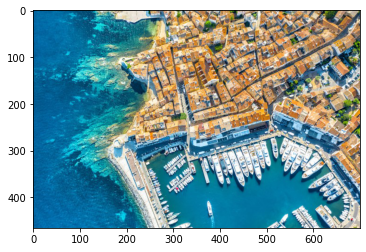

In [4]:
plt.imshow(image)

### Split up into (100x100) pixel squares

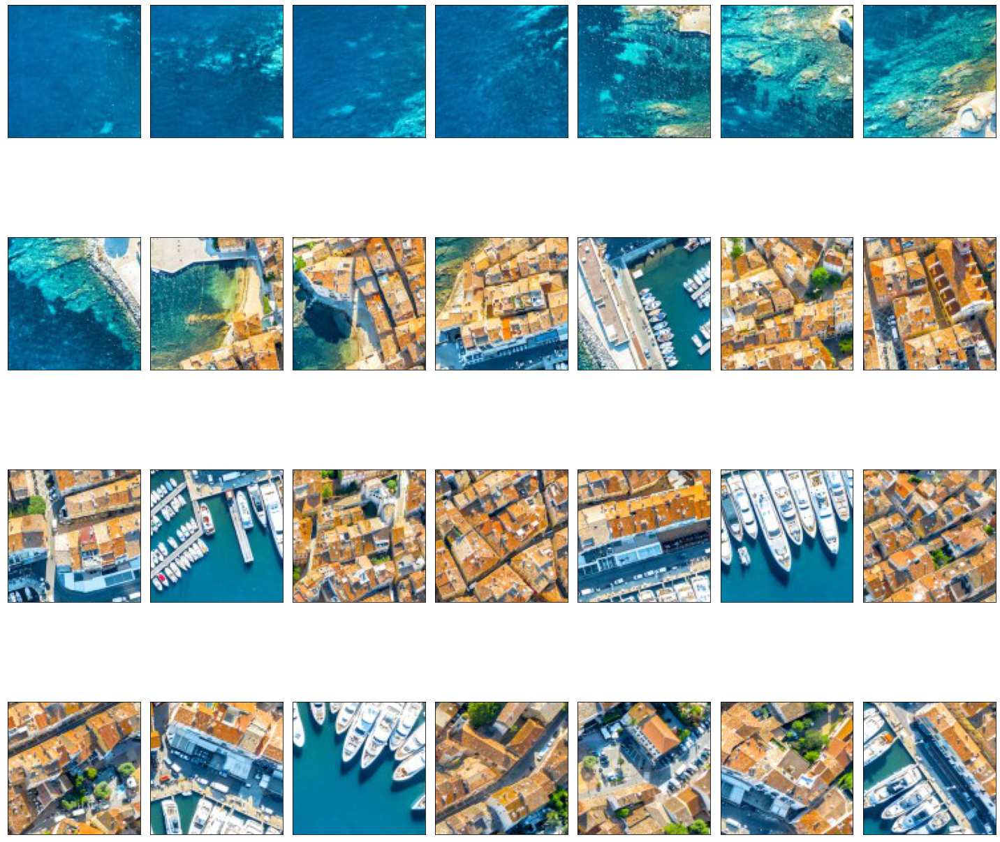

In [5]:
def split_image(image):
  num_rows, num_cols = 0, 0
  patches = []
  ymax, xmax = image.shape[0], image.shape[1]
  for i in range(0, xmax, 100):
    i_max = i + 100
    if i_max > xmax:
      continue
    num_cols += 1
    # i_max = xmax if (i + 100 > xmax) else i + 100
    for j in range(0, ymax, 100):
      j_max = j + 100
      if j_max > ymax:
        continue
      num_rows += 1
      # j_max = ymax if (j + 100 > ymax) else j + 100
      patches.append(image[j:j_max, i:i_max, :])

  num_rows = num_rows // num_cols
  return num_rows, num_cols, patches


def display_patches(num_rows, num_cols, patches,
                    feature=None, probs=None, ranks=None):
  plt.figure(figsize=(20, 20))
  for pid, patch in enumerate(patches):
    # print("plt.subplot({:d}, {:d}, {:d})".format(num_rows, num_cols, pid + 1))
    plt.subplot(num_rows, num_cols, pid + 1)
    plt.xticks([])
    plt.yticks([])
    if feature is not None:
      assert ranks is not None
      assert probs is not None
      assert len(ranks) == len(probs)
      plt.title("{:s} (rank: {:d}, p: {:.3f})".format(
        feature, ranks[pid]+1, probs[pid]))
    plt.imshow(patch)

  plt.tight_layout()
  plt.show()


num_rows, num_cols, patches = split_image(image)
display_patches(num_rows, num_cols, patches)

### Apply model to each patch and synthetic caption

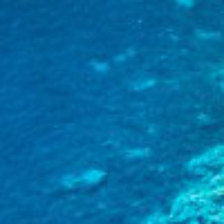

In [6]:
image_preprocessor = Compose([
  ToPILImage(),
  Resize(224)
])

random_pid = np.random.randint(0, len(patches))
patch_p = image_preprocessor(patches[random_pid])
patch_p

In [7]:
model = FlaxCLIPModel.from_pretrained("flax-community/clip-rsicd-v2")
processor = CLIPProcessor.from_pretrained("flax-community/clip-rsicd-v2")

INFO:absl:Starting the local TPU driver.
INFO:absl:Unable to initialize backend 'tpu_driver': Not found: Unable to find driver in registry given worker: local://


INFO:absl:Unable to initialize backend 'tpu': Invalid argument: TpuPlatform is not available.


ftfy or spacy is not installed using BERT BasicTokenizer instead of ftfy.


In [8]:
searched_feature = "boats"

In [9]:
def get_patch_probabilities(patches, searched_feature, 
                            image_preprocesor,
                            model, processor):
  images = [image_preprocesor(patch) for patch in patches]
  text = "An aerial image of {:s}".format(searched_feature)
  inputs = processor(images=images,
                    text=text,
                    return_tensors="jax",
                    padding=True)
  outputs = model(**inputs)
  probs = jax.nn.softmax(outputs.logits_per_text, axis=-1)
  probs_np = np.asarray(probs)[0]
  return probs_np


patch_probs = get_patch_probabilities(patches,
                                      searched_feature,
                                      image_preprocessor,
                                      model,
                                      processor)
patch_probs

array([0.00672766, 0.01906032, 0.00439184, 0.01744475, 0.04968581,
       0.03865175, 0.0279851 , 0.00635015, 0.01349009, 0.01962317,
       0.01380907, 0.07292309, 0.00108302, 0.0045694 , 0.00383596,
       0.18047883, 0.001756  , 0.00587313, 0.00731393, 0.15510839,
       0.00069231, 0.00175518, 0.02323904, 0.06869765, 0.0013614 ,
       0.00294228, 0.01650203, 0.23464869], dtype=float32)

In [10]:
def get_image_ranks(probs):
  temp = np.argsort(-probs)
  ranks = np.empty_like(temp)
  ranks[temp] = np.arange(len(probs))
  return ranks

patch_ranks = get_image_ranks(patch_probs)
patch_ranks

array([16, 10, 20, 11,  5,  6,  7, 17, 14,  9, 13,  3, 26, 19, 21,  1, 23,
       18, 15,  2, 27, 24,  8,  4, 25, 22, 12,  0])

### Results for "boats"

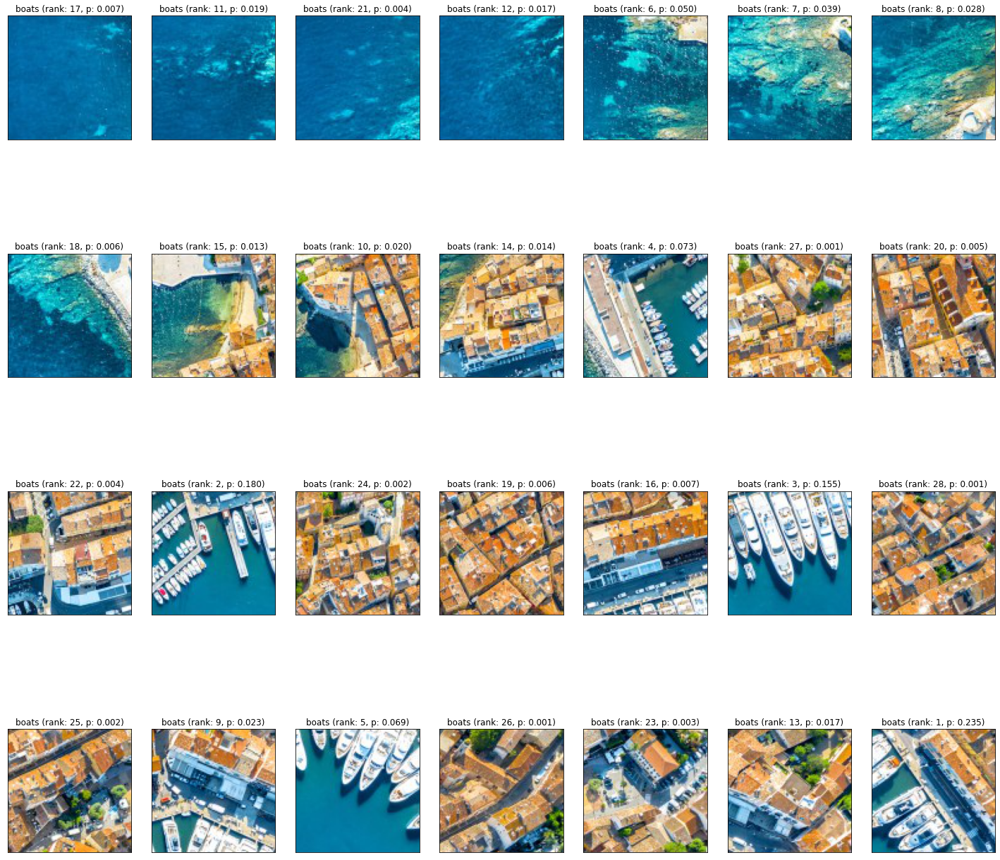

In [11]:
display_patches(num_rows, num_cols, patches,
  feature=searched_feature, probs=patch_probs, ranks=patch_ranks)

### Results for "beach"

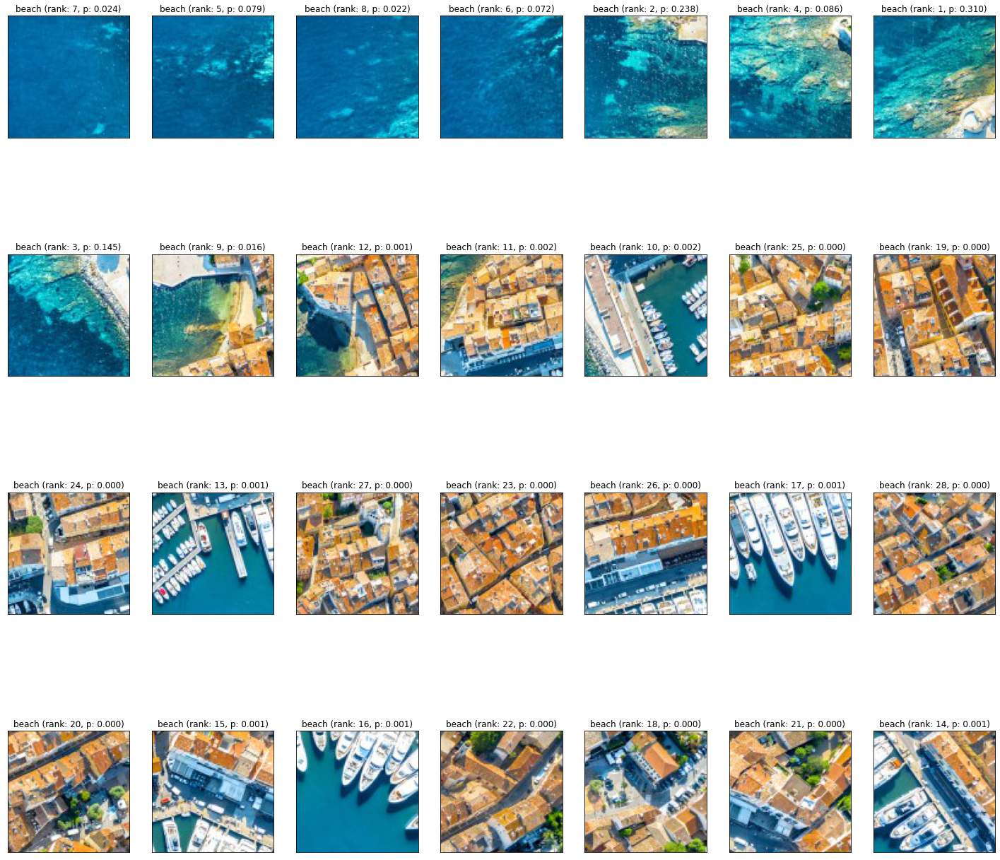

In [12]:
searched_feature = "beach"
patch_probs = get_patch_probabilities(patches,
                                      searched_feature,
                                      image_preprocessor,
                                      model,
                                      processor)
patch_ranks = get_image_ranks(patch_probs)
display_patches(num_rows, num_cols, patches,
  feature=searched_feature, probs=patch_probs, ranks=patch_ranks)

### Results for "houses"

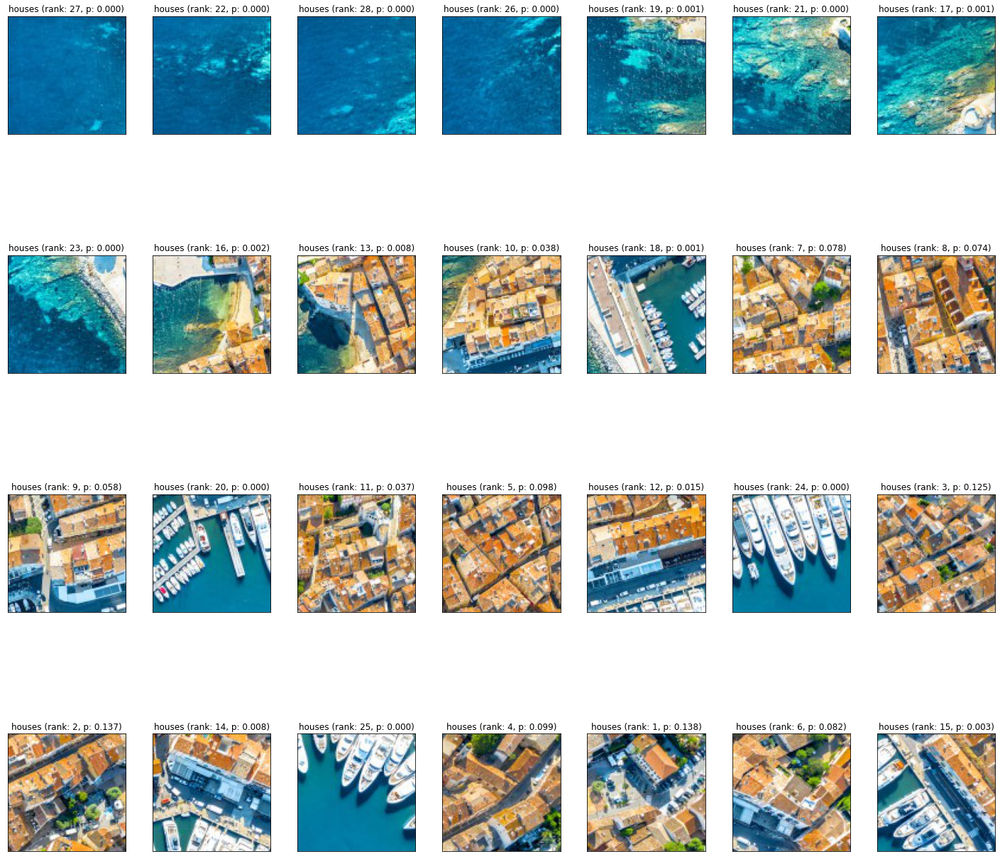

In [13]:
searched_feature = "houses"
patch_probs = get_patch_probabilities(patches,
                                      searched_feature,
                                      image_preprocessor,
                                      model,
                                      processor)
patch_ranks = get_image_ranks(patch_probs)
display_patches(num_rows, num_cols, patches,
  feature=searched_feature, probs=patch_probs, ranks=patch_ranks)